Please note that this notebook is ran on the outdated version and will no longer execute correctly.

# Setup

In [1]:
import os

import numpy as np

from tqdm.notebook import tqdm
from PIL import Image

from src.data_preparation_utils import RESULTS_DIR
from src.data_extraction_pipeline import (
    _get_noise_classifier,
    NOISE_CANDIDATE_LABELS,
    LABEL_TO_REMOVE,
)
from src.utils import plot_images

In [2]:
for file in os.listdir(RESULTS_DIR):
    if "train_" in file:
        data = np.load(os.path.join(RESULTS_DIR, file))

        sample_images = data["images"][:300]
        sample_labels = data["labels"][:300]
        break

# Eda

In [3]:
classifier = _get_noise_classifier()

results = []
for img in tqdm(sample_images, total=len(sample_images), desc="Classifying images"):
    result = classifier(Image.fromarray(img), candidate_labels=NOISE_CANDIDATE_LABELS)
    results.append(result)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Device set to use mps:0


Classifying images:   0%|          | 0/300 [00:00<?, ?it/s]

In [4]:
corrected_labels = [entry[0]["label"] for entry in results]
scores = [entry[0]["score"] for entry in results]

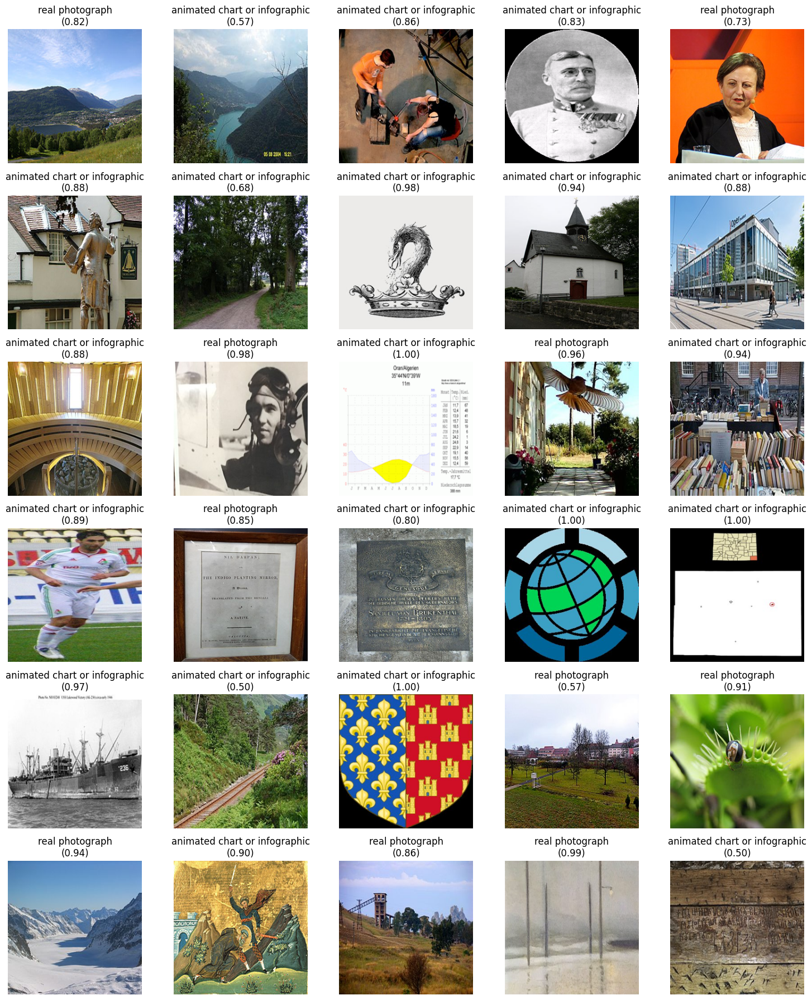

In [5]:
plot_images(
    sample_images[:30],
    ncols=5,
    labels=[
        f"{label}\n({score:.2f})" for label, score in zip(corrected_labels, scores)
    ][:30],
)

In [6]:
indices_to_delete = np.array(
    [
        i
        for i, (label, score) in enumerate(zip(corrected_labels, scores))
        if label == LABEL_TO_REMOVE and score > 0.9
    ]
)

print(f"Deleting {len(indices_to_delete)} images from the dataset")

Deleting 109 images from the dataset


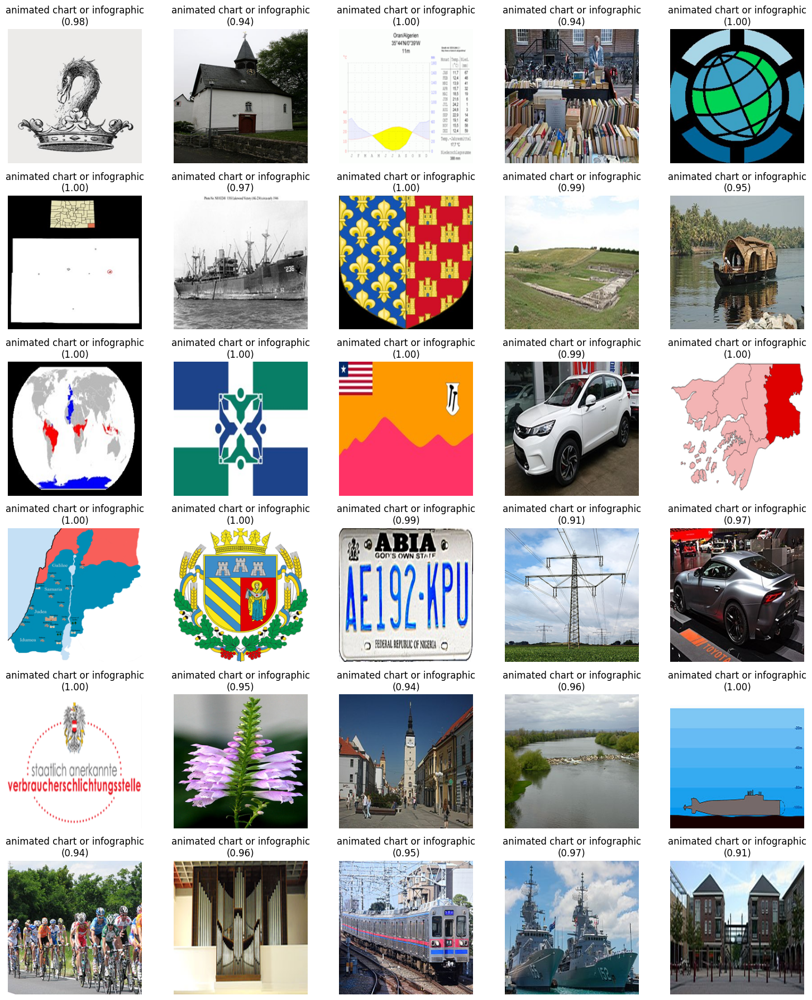

In [7]:
plot_images(
    sample_images[indices_to_delete[:30]],
    ncols=5,
    labels=[
        f"{corrected_labels[i]}\n({scores[i]:.2f})" for i in indices_to_delete[:30]
    ],
)

Let's make higher threshold > 0.95, because there are many false positives. 

In [11]:
indices_to_delete = np.array(
    [
        i
        for i, (label, score) in enumerate(zip(corrected_labels, scores))
        if label == LABEL_TO_REMOVE and score > 0.95
    ]
)

print(f"Deleting {len(indices_to_delete)} images from the dataset")

Deleting 78 images from the dataset


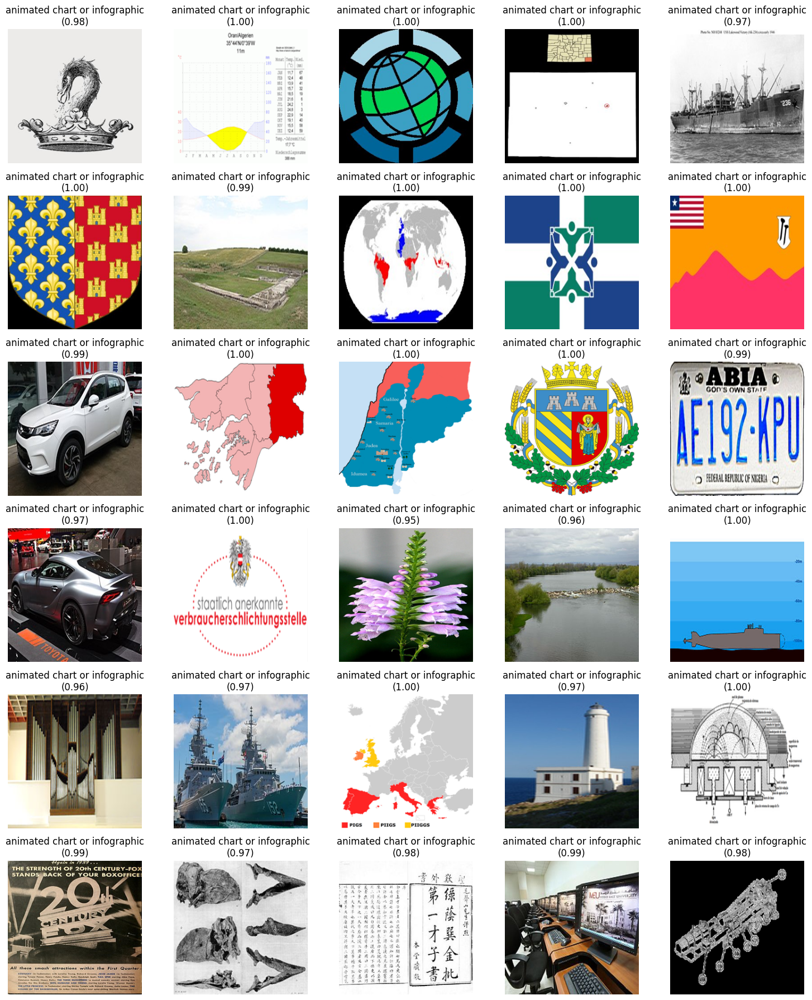

In [12]:
plot_images(
    sample_images[indices_to_delete[:30]],
    ncols=5,
    labels=[
        f"{corrected_labels[i]}\n({scores[i]:.2f})" for i in indices_to_delete[:30]
    ],
)

This gives acceptable ratio of false positives.